## Исследование данных о рынке заведений общественного питания Москвы



###### Цель исследования:
Определить перспективные категории заведений общественного питания для инвестиций.
Изучить распределение заведений по районам и их характеристики.
Проанализировать предпочтения по типам заведений и их вместимости.

###### Ход исследования:
1. Анализ распределения заведений по категориям:

Исследование количества заведений каждой категории.
Построение графиков распределения для выявления наиболее популярных типов заведений.
Исследование распределения заведений по районам:

Анализ числа заведений в различных районах Москвы.
Визуализация распределения с использованием карты или графиков.
Анализ вместимости заведений:

Оценка средней вместимости различных категорий заведений.
Исследование влияния вместимости на популярность заведений.
###### Общий вывод: В конечном выводе мы подведем итоги проведенного исследования и сформулируем основные выводы и рекомендации.

В результате исследования выявлены перспективные категории заведений для инвестирования. Обнаружены особенности распределения по районам и вместимости. Рекомендации представлены в виде конкретных выводов, которые помогут инвесторам принять информированное решение по открытию заведения общественного питания в Москве.

In [1]:
!pip install folium

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium import Map, Marker, Icon, Popup
from folium.plugins import MarkerCluster
from folium import Marker, Popup
from folium import Choropleth

<a id="1"></a>

In [3]:
try:
    # Попытка загрузить файл локально
    data = pd.read_csv('moscow_places.csv')
except FileNotFoundError:
    try:
        # Попытка загрузить файл на сервере
        data = pd.read_csv('/path/to/moscow_places.csv')
    except FileNotFoundError:
        # Если файл не найден ни локально, ни на сервере, выведите сообщение об ошибке
        print("Файл не найден. Пожалуйста, укажите правильный путь к файлу.")
        data = None

if data is not None:
    display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Проверим есть ли дубликаты и пропуски в данных.

In [5]:
data.duplicated().sum()

0

Явных дубликатов нет

In [6]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [7]:
print('Количество заведений:', data.name.nunique())

Количество заведений: 5614


In [8]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


In [9]:
data.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Мы рассмотрели предоставленные данные. 
Общее количество заведений 8406. Возможно, есть неявные дубликаты в виде повторяющихся названий, адресов и прочее. 
Пропуски обнаружены в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. 
Значение middle_avg_bill можно взять из столбца avg_bill. Заполнить столбцы hours, price, seats не можем заполнить средними значениями, так как это будет не логично. 
Рынок заведений общественного питания представлен такими категориями как: 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб','быстрое питание', 'булочная', 'столовая'

### Предобработка данных

Переведем данные в нижний регистр и проверим заведения на наличие дубликатов

In [10]:
data.name = data['name'].str.lower()
data.address = data['address'].str.lower()
print ('Полных дубликтов по названию заведения:',data.name.duplicated().sum())

Полных дубликтов по названию заведения: 2894


После изменения названий к нижнему регистру нашлись дубликаты.Проверим дубликаты по названию заведения и адресу

In [11]:
print ('Дубликтов по названию и адресу:',data.duplicated(subset=['name', 'address']).sum())

Дубликтов по названию и адресу: 4


In [12]:
data.loc[data.duplicated(subset=['name', 'address'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Увидели, что есть заведение "кафе", можем поискать в открытых источниках название кафе по координатам. Название кафе с индексом 189 назвается "get&fly" кафе с индексом 215 называется "кафе"

Ресторан more poke работает с 9 до 21 ежедневно Источник: https://o-eda-dostavka.ru/goroda/moscow/rest/more_poke_wfuoa/

Бар Раковарня работает Понедельник – Четверг, Воскресенье – с 12:00 до 00:00 Пятница – Суббота – с 12:00 до 01:00 Источник: https://alekseevskaya.kleshnihvosti.ru/contacts/

Пекарня Хлеб да выпечка работает с 9 до 22. Источник: https://yandex.ru/maps/org/khleb_da_vypechka/57676860798/?indoorLevel=-1&ll=37.411004%2C55.738591&z=17

Удалим дубликаты оставив те, где информации больше.

In [13]:
data.loc[189, 'name'] = data.loc[189, 'name'].replace('кафе','get&fly')
data.query('name == "get&fly"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,get&fly,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN


In [14]:
data = data.drop(index= [1511, 2211 ,3109])
data.reset_index(drop=True)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8398,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8399,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8400,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8401,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [15]:
data["is_247"] = data['hours'].str.match(r"ежедневно") & data["hours"].str.match(r".*круглосуточно.*")


In [16]:
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия', 'просек','пр-т','-й','-я','парк']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

#Чтобы извлечь только название улицы из столбца address используем str.extract
data["street"] = data["address"].str.extract(str_pat)

data.query('street.isna()').address.count()

145

У 145 заведений нет улиц в адресе

In [17]:
data.query('street.isna()').address.unique()

array(['москва, парк левобережный',
       'москва, ландшафтный заказник лианозовский',
       'москва, лианозовский парк культуры и отдыха',
       'москва, парк алтуфьево', 'москва, парк ангарские пруды',
       'москва, проектируемый проезд № 5265',
       'москва, парк этнографическая деревня бибирево',
       'москва, северный административный округ, головинский район',
       'москва, парк культуры и отдыха северное тушино',
       'москва, северо-западный административный округ, район северное тушино',
       'москва, парк дружбы', 'москва, ленинградское шоссе',
       'москва, северный административный округ, район левобережный, территория парка дружбы',
       'москва, коптевский бульвар д 18 а стр 1',
       'москва, грузинский сквер',
       'москва, северо-восточный административный округ, район отрадное',
       'москва, северо-восточный административный округ, останкинский район, выставка достижений народного хозяйства, кольцевая дорога',
       'москва, парк останкино',


У 145 заведений различные наименования, не входящий в состав стандартных названий "улица, проспект" и тд

<a id="3"></a>

#### Анализ данных

In [18]:
data.query('street.isna()').address.count()

145

In [19]:
data.category.value_counts()

кафе               2377
ресторан           2041
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [20]:
data.seats.describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

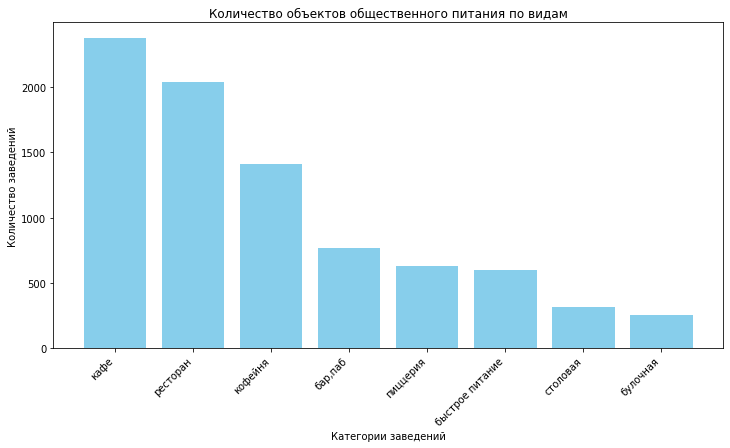

In [21]:
# Группируем данные по категориям и подсчитываем количество заведений
category_counts = data['category'].value_counts()

# Строим столбчатую диаграмму
plt.figure(figsize=(12, 6))
bars = plt.bar(category_counts.index, category_counts, color='skyblue')

plt.title('Количество объектов общественного питания по видам')
plt.xlabel('Категории заведений')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')  # Поворачиваем названия категорий для улучшения читаемости
plt.show()


In [22]:
# Подсчитываем количество заведений в каждой категории
category_counts = data['category'].value_counts()

# Вычисляем долю каждой категории от общего числа заведений
category_percentage = (category_counts / len(data)) * 100

# Выводим результаты
print("Доля каждой категории в общем количестве заведений:")
print(category_percentage)


Доля каждой категории в общем количестве заведений:
кафе               28.287516
ресторан           24.288944
кофейня            16.815423
бар,паб             9.103891
пиццерия            7.533024
быстрое питание     7.176009
столовая            3.748661
булочная            3.046531
Name: category, dtype: float64


Самой популярной категорией, представленной наибольшим количеством заведений, являются кафе — их 2378, доля которых в общем количестве заведений, составляет около 28.29%. Это самая распространенная категория. 
На втором месте идут рестораны с 2043 заведениями, составляя примерно 24.30% от общего числа заведений. 
Булочные представлены наименьшим числом заведений, всего 256, составляя примерно 3.05% от общего количества.

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4792 non-null   float64
 14  is_247             8403 non-null   bool   
 15  street             8258 non-null   object 
dtypes: bool(1), float64(6), 

Заведения с отсутствующими данными будут мешать нам проводить дальнейшее исследование и искажать данные. Рассмотрим данные только там, где места указаны.

Явной странностью в данных обладают места, с наибольшим количесвтом посадочных мест ровно 1288, это кафе, кофейня, пиццерия и ресторан. Минимальное кол-во мест 0- это скорее всего нормально.Медианные значения колеблются от 50 до 80 в зависимости от категории заведения. Наибольшими количеством мест статистически обладают, кофейни, предприятия быстрого питания, рестораны и бары.

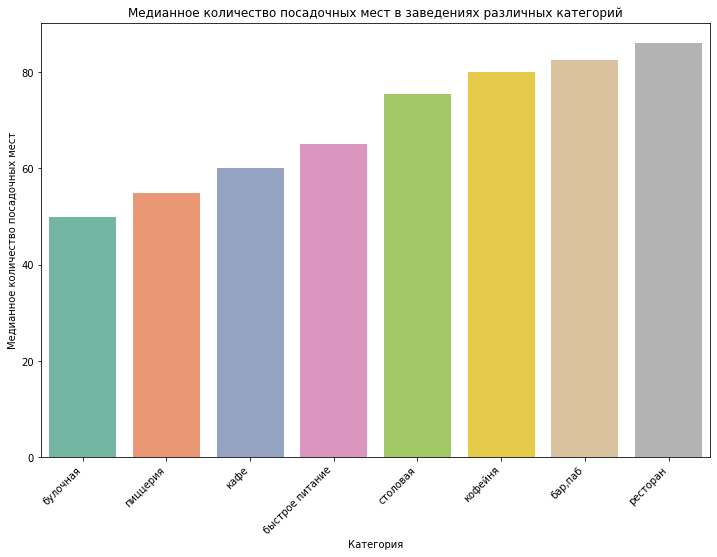

In [24]:
# Строим столбчатую диаграмму, используя медиану и сортируя по убыванию
plt.figure(figsize=(12, 8))
sns.barplot(x='category', y='seats', data=data, palette='Set2', estimator=np.median, ci=None, order=data.groupby('category')['seats'].median().sort_values(ascending=True).index)
plt.title('Медианное количество посадочных мест в заведениях различных категорий')
plt.xlabel('Категория')
plt.ylabel('Медианное количество посадочных мест')
plt.xticks(rotation=45, ha='right')
plt.show()


Наибольшее количество посадочных мест обладают рестораны, затем кофейни, столовые, кафе и быстрое питание.

In [25]:
data['is_chain'] = data['chain'].map({ 0:'несетевое', 1:'сетевое'})
network_counts = data.is_chain.value_counts().reset_index()
network_counts = network_counts.rename(columns={'index': 'type', 'is_chain': 'count'})
network_counts

,type,count
0,несетевое,5199
1,сетевое,3204


Итак, несетевых заведений больше, чем сетевых, а именно: несетевых заведений в данных 5199, а сетевых 3204.

Для того, чтобы определить, какие категории заведений чаще являются сетевыми,построим столбчатую диаграмму, где по оси X будут категории заведений, а по оси Y — процент сетевых заведений в каждой категории.

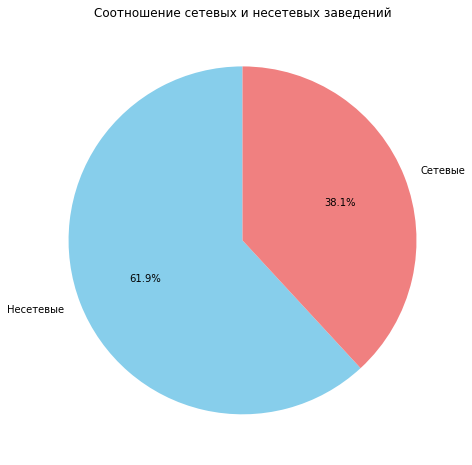

In [26]:
# Подсчет количества сетевых и несетевых заведений
network_counts = data['chain'].value_counts()

# Строим круговую диаграмму
plt.figure(figsize=(8, 8))
plt.pie(network_counts, labels=['Несетевые', 'Сетевые'], autopct='%1.1f%%', colors=['skyblue', 'lightcoral'], startangle=90)
plt.title('Соотношение сетевых и несетевых заведений')
plt.show()


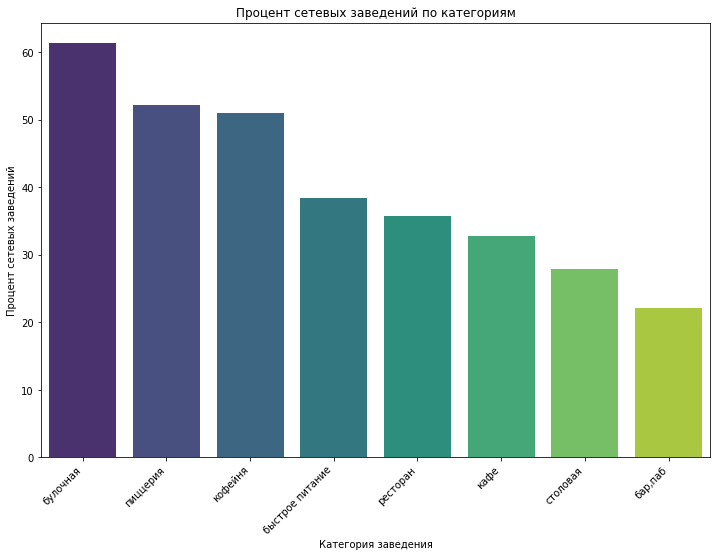

In [27]:
# Группировка данных по категориям и подсчет процента сетевых заведений в каждой категории
category_chain_percentage = data.groupby('category')['chain'].mean() * 100

# Сортируем значения по убыванию
category_chain_percentage = category_chain_percentage.sort_values(ascending=False)

# Строим столбчатую диаграмму
plt.figure(figsize=(12, 8))
sns.barplot(x=category_chain_percentage.index, y=category_chain_percentage, palette='viridis')
plt.title('Процент сетевых заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Процент сетевых заведений')
plt.xticks(rotation=45, ha='right')
plt.show()



In [28]:
category_chain = data.groupby(['category','is_chain']).agg({'chain': 'count'}).reset_index()
category_chain = category_chain.rename(columns={'index': 'category', 'is_chain': 'type', 'chain': 'count'})
category_chain

,category,type,count
0,"бар,паб",несетевое,596
1,"бар,паб",сетевое,169
2,булочная,несетевое,99
3,булочная,сетевое,157
4,быстрое питание,несетевое,371
5,быстрое питание,сетевое,232
6,кафе,несетевое,1598
7,кафе,сетевое,779
8,кофейня,несетевое,693
9,кофейня,сетевое,720


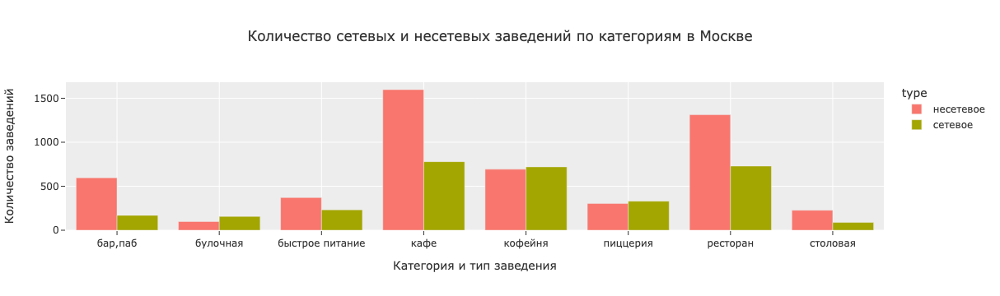

In [29]:
fig = px.bar(category_chain, 
             x='category', 
             y= 'count', 
             title = 'Количество сетевых и несетевых заведений по категориям в Москве', 
             template = 'ggplot2',
             color='type', barmode='group')
fig.update_layout(xaxis_title = 'Категория и тип заведения',
                  yaxis_title = 'Количество заведений')
fig.update_traces(hovertemplate = 'Категория заведения : %{x} <br>Количество: %{y}')

fig.show()

Сетевых заведений больше всего у категории "кафе", затем "кофейня","ресторан".  

#### Топ-15 популярных сетей в Москве.


Для выполнения этой задачи, давайте сначала сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве по количеству заведений. Затем мы можем построить график для визуализации этой информации.

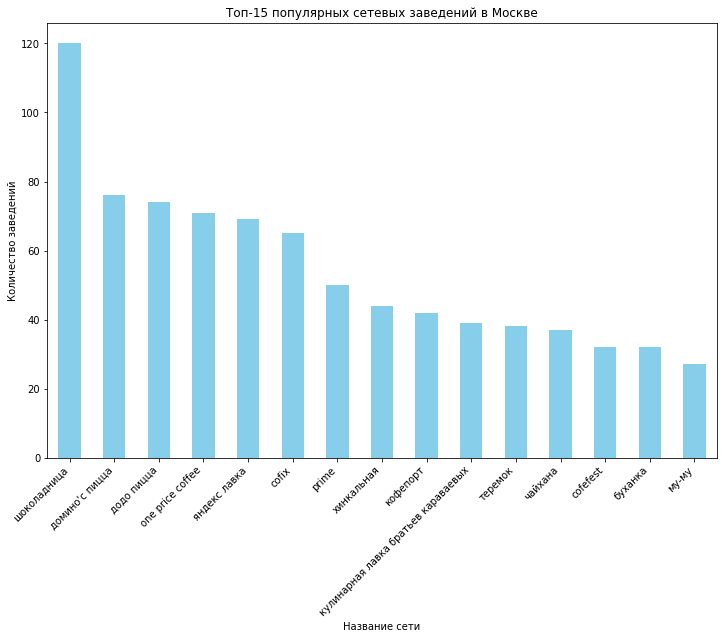

In [30]:
# Фильтруем данные по сетевым заведениям
network_data = data[data['chain'] == 1]

# Группируем данные по названиям сетевых заведений и подсчитываем количество заведений для каждой сети
top_network_chains = network_data.groupby('name')['name'].count().sort_values(ascending=False).head(15)

# Построим столбчатую диаграмму
plt.figure(figsize=(12, 8))
top_network_chains.plot(kind='bar', color='skyblue')
plt.title('Топ-15 популярных сетевых заведений в Москве')
plt.xlabel('Название сети')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.show()


In [31]:
top_15 = data.query('is_chain == "сетевое"').groupby(['name', 'category']).agg({'address':'count'}).reset_index().sort_values(by=['address'],ascending=False, inplace=False).head(15)
top_15

,name,category,address
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


Эти данные могут быть полезны для анализа рынка и принятия решений об инвестициях или развитии сетевых заведений в Москве. 
Чтобы узнать, есть ли какие-то признаки, объединяющие эти популярные сетевые заведения,определим категории для топ-15 заведений

In [32]:
# Получим уникальные значения в столбце 'category' для топ-15 популярных сетевых заведений
unique_categories = data[data['name'].isin(top_network_chains.index)]['category'].unique()
print("Уникальные категории для топ-15 популярных сетевых заведений:")
print(unique_categories)

Уникальные категории для топ-15 популярных сетевых заведений:
['булочная' 'пиццерия' 'кофейня' 'кафе' 'ресторан' 'быстрое питание'
 'столовая' 'бар,паб']


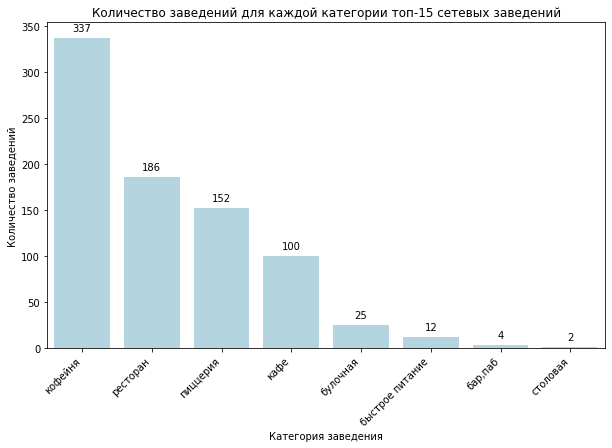

In [33]:
# Получим уникальные значения в столбце 'category' для топ-15 популярных сетевых заведений
unique_categories = data[data['name'].isin(top_network_chains.index)]['category'].value_counts()

# Построим столбчатую диаграмму с целыми значениями и голубым цветом
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=unique_categories.index, y=unique_categories.values, color='lightblue')

# Добавим аннотации с целыми значениями над каждым столбцом
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.title('Количество заведений для каждой категории топ-15 сетевых заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.show()




Исходя из уникальных категорий для топ-15 популярных сетевых заведений, можно сделать следующие выводы:

Разнообразие категорий: Популярные сетевые заведения охватывают различные категории, включая булочные, пиццерии, кофейни, кафе, рестораны, быстрое питание, столовые, бары и пабы.

Широкий спектр предложений: Это свидетельствует о том, что сетевые заведения могут успешно развиваться в разных сферах общественного питания, предлагая различные продукты и услуги.

Адаптация к различным форматам: Сетевые заведения могут адаптироваться к различным форматам потребления, от быстрого питания до ресторанов и баров.

Возможное стремление к диверсификации: Популярные сетевые заведения могут стремиться к диверсификации своего предложения, привлекая широкую аудиторию и охватывая различные сегменты рынка.

#### Анализ рынка по административным округам

In [34]:
data.district.value_counts()

Центральный административный округ         2242
Северный административный округ             899
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

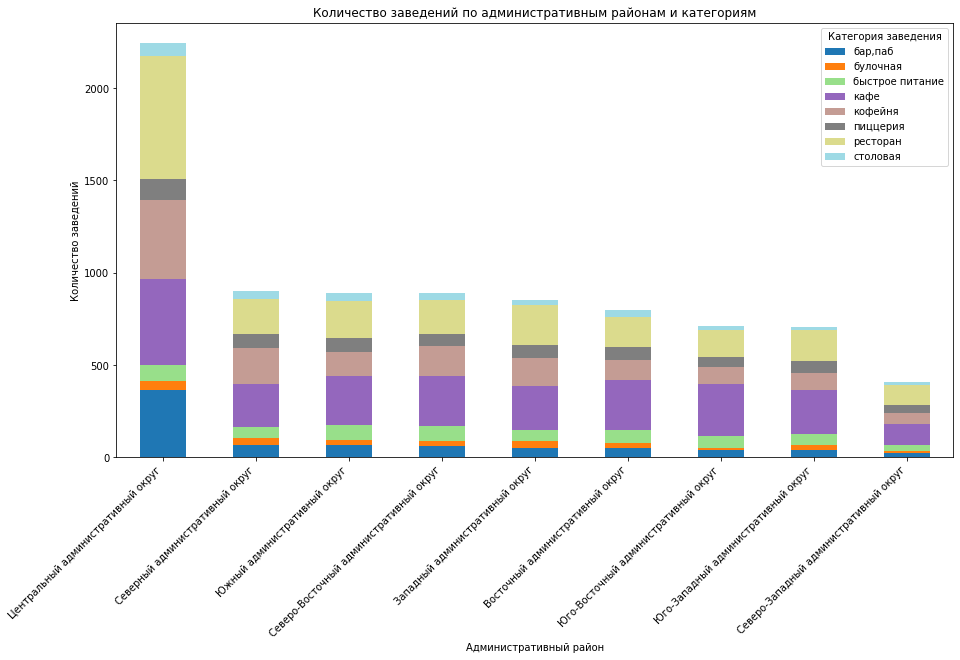

In [35]:
# Сгруппируем данные по административным районам и категориям, подсчитаем количество заведений 
grouped_data = data.groupby(['district', 'category']).size().unstack(fill_value=0) 
 
# Добавим столбец с общим количеством заведений по районам 
grouped_data['total'] = grouped_data.sum(axis=1) 
 
# Отсортируем сводную таблицу по общему количеству заведений 
grouped_data = grouped_data.sort_values(by='total', ascending=False) 
 
# Отобразим информацию на столбчатой диаграмме 
grouped_data.drop('total', axis=1).plot(kind='bar', stacked=True, cmap='tab20', figsize=(15, 8)) 
plt.title('Количество заведений по административным районам и категориям') 
plt.xlabel('Административный район') 
plt.ylabel('Количество заведений') 
plt.legend(title='Категория заведения') 
plt.xticks(rotation=45, ha='right') 
plt.show()

Наибольшим количеством заведений обладает ЦАО-2242 заведения, затем САО-899 заведения, ЮАО-892 заведения и так далее, наименьшее кол-во заведний представлено в ЮАО- 409 заведения. 

Из графика распределения заведений по административному району видим, что в ЦАО лидирующей категорией заведений является ресторан, а в других-кафе. 
Стоит заметить, что структура распределения категорий почти идентична во всех районах.

#### Анализ средних рейтингов по категориям заведений

Для визуализации распределения средних рейтингов по категориям заведений используем boxplot. Boxplot позволяет оценить медиану, квартили и наличие выбросов. 

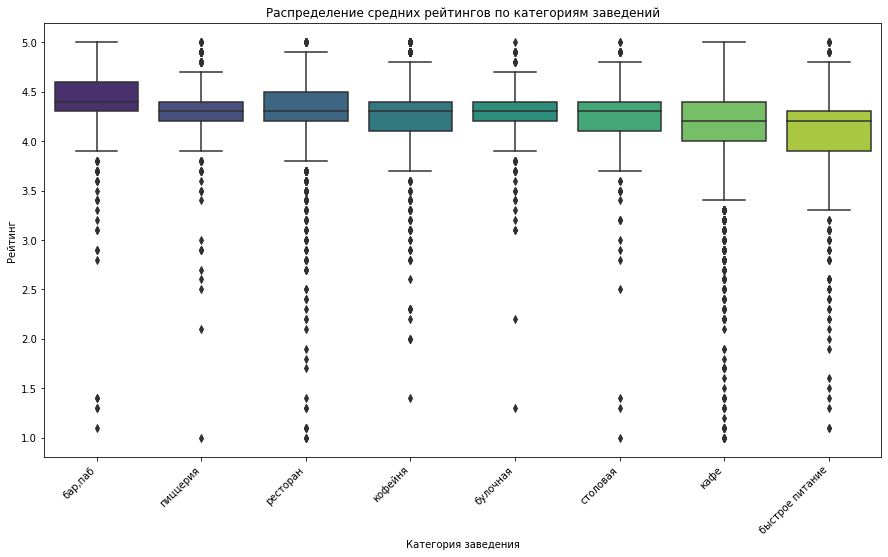

In [36]:
# Усредним рейтинги для каждой категории
avg_ratings_by_category = data.groupby('category')['rating'].mean().sort_values(ascending=False)

# Построим boxplot
plt.figure(figsize=(15, 8))
sns.boxplot(x=data['category'], y=data['rating'], order=avg_ratings_by_category.index, palette='viridis')
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг')
plt.xticks(rotation=45, ha='right')
plt.show()

In [37]:
data.groupby('category').agg({'rating': 'describe'})

rating                                             
                  count      mean       std  min  25%  50%  75%  max
category                                                            
бар,паб           765.0  4.387712  0.380143  1.1  4.3  4.4  4.6  5.0
булочная          256.0  4.268359  0.386303  1.3  4.2  4.3  4.4  5.0
быстрое питание   603.0  4.050249  0.560949  1.1  3.9  4.2  4.3  5.0
кафе             2377.0  4.123896  0.566200  1.0  4.0  4.2  4.4  5.0
кофейня          1413.0  4.277282  0.372250  1.4  4.1  4.3  4.4  5.0
пиццерия          633.0  4.301264  0.336162  1.0  4.2  4.3  4.4  5.0
ресторан         2041.0  4.290348  0.413237  1.0  4.2  4.3  4.5  5.0
столовая          315.0  4.211429  0.454205  1.0  4.1  4.3  4.4  5.0

Из представленных статистических данных о рейтингах по категориям заведений видно следующее:
   - Бары и пабы (бар,паб): Средний рейтинг 4.39
   - Булочные (булочная): Средний рейтинг 4.27
   - Быстрое питание: Средний рейтинг 4.05
   - Кафе: Средний рейтинг 4.12,
   - Кофейни: Средний рейтинг 4.28
   - Пиццерии: Средний рейтинг 4.30
   - Рестораны: Средний рейтинг 4.29
   - Столовые: Средний рейтинг 4.21

В целом, средние рейтинги по разным категориям заведений довольно близки, с некоторым разбросом. Большинство заведений в каждой категории имеют рейтинг в диапазоне от 4.0 до 4.5.

#### Фоновая картограмма с рейтингом

In [38]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём объект m – карту с центром в точке с координатами [moscow_lat, moscow_lng]
m = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron')
# выводим карту
m

In [39]:
moscow_lat, moscow_lng = 55.751244, 37.618423 
 
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson' 
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10) 
 
# Добавляем хороплет с рейтингами по районам 
folium.Choropleth( 
 geo_data=state_geo, 
 name='choropleth', 
 data=data.groupby('district')['rating'].mean().reset_index(), 
 columns=['district', 'rating'], 
 key_on='feature.name', 
 fill_color='YlGnBu', 
 fill_opacity=0.7, 
 line_opacity=0.2, 
 legend_name='Средний рейтинг по районам' 
).add_to(m) 
 
# Добавляем маркеры заведений 
# for index, row in data.iterrows(): 
# folium.Marker([row['lat'], row['lng']], popup=f"{row['name']} - {row['rating']}").add_to(m) 
 
# Выводим карту 
m


Заведения с наиболее высоким рейтингом находятся ближе к центру Москвы

In [40]:
# Загрузка JSON-файла с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# Создаем карту Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)


# Функция для создания маркеров и добавления их в кластер
def create_clusters(row):
    # Создаем маркер с иконкой и добавляем его в кластер
    Marker(
        location=[row['lat'], row['lng']],
        popup=Popup(f"{row['name']} {row['rating']}"),
    ).add_to(marker_cluster)

# Применяем функцию для создания кластеров к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# Выводим карту
m


В ЦАО высокий рейтинг, в ЮЗАО, СВАО и ЮВАО рейтинг ниже.

#### Топ-15 улиц по количеству заведений

Начнем с нахождения топ-15 улиц по количеству заведений. После этого мы сможем построить график распределения заведений и их категорий.

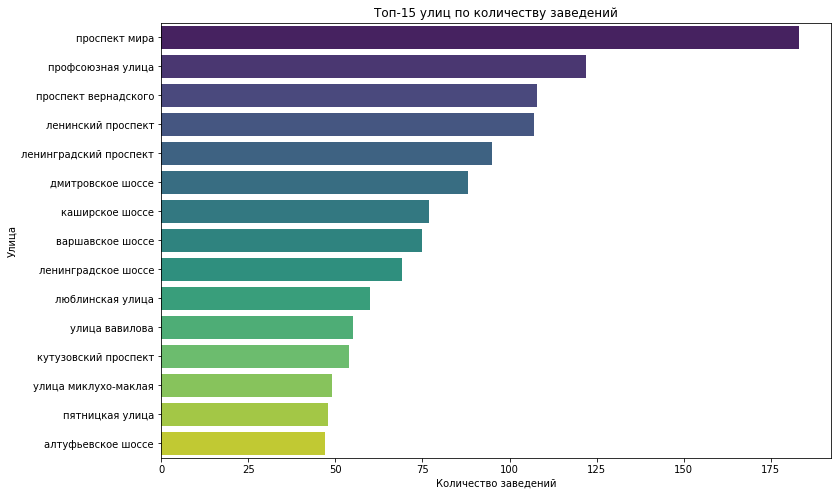

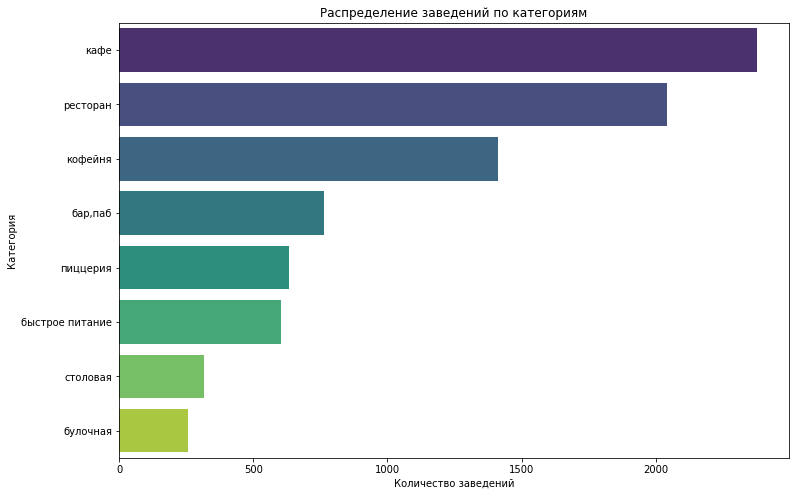

In [41]:
# Найдем топ-15 улиц по количеству заведений
top15_streets = data['street'].value_counts().head(15)

# Визуализируем распределение заведений по топ-15 улицам
plt.figure(figsize=(12, 8))
sns.barplot(x=top15_streets.values, y=top15_streets.index, palette='viridis')
plt.title('Топ-15 улиц по количеству заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Улица')
plt.show()

# Визуализируем распределение категорий заведений
plt.figure(figsize=(12, 8))
sns.countplot(y='category', data=data, order=data['category'].value_counts().index, palette='viridis')
plt.title('Распределение заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')
plt.show()


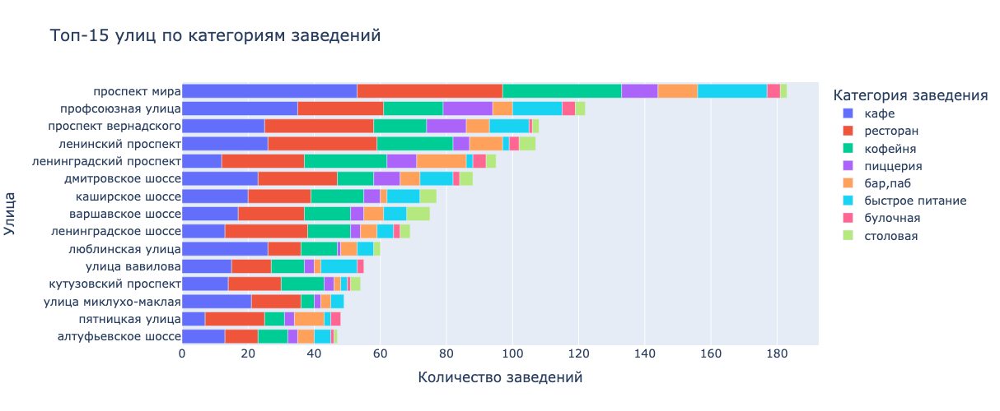

In [42]:
# Отфильтруем общую таблицу по списку названий топ-15 улиц
filtered_data = data[data['street'].isin(top15_streets.index)]

# Группируем данные по улице и категории, подсчитываем количество заведений
street_category_counts = filtered_data.groupby(['street', 'category']).size().reset_index(name='count')

# Сортируем данные для каждой категории по убыванию
sorted_street_category_counts = street_category_counts.sort_values(by=['count'], ascending=True)

# Строим график с накоплением
fig = px.bar(sorted_street_category_counts,
             x='count',
             y='street',
             color='category',
             orientation='h',
             title='Топ-15 улиц по категориям заведений',
             labels={'count': 'Количество заведений', 'street': 'Улица'},
             category_orders={'category': data['category'].unique()}
            )

# Обновляем макет
fig.update_layout(
    font=dict(size=14),
    legend_title="Категория заведения",
    width=1000,
    height=500
)
fig.update_layout(yaxis = {"categoryorder":"total ascending"})

fig.show()

In [43]:
named_st = data.loc[data['street'] != 'untitled']
top15street = named_st.groupby('street').agg({'street':'count'}).rename(columns={'street':'count'}).reset_index().sort_values(by = 'count', ascending = False).head(15)
top15street

,street,count
814,проспект мира,183
818,профсоюзная улица,122
811,проспект вернадского,108
540,ленинский проспект,107
538,ленинградский проспект,95
392,дмитровское шоссе,88
473,каширское шоссе,77
322,варшавское шоссе,75
539,ленинградское шоссе,69
559,люблинская улица,60


Большинство заведений находятся на Проспекте Мира, Профсоюзной улице и Проспекте Вернадского.

#### Улицы, на которых находится только один объект общепита

Чтобы найти улицы, на которых находится только один объект общепита, можно воспользоваться группировкой данных по улицам и подсчетом количества заведений на каждой улице. Затем нужно выбрать те улицы, где количество заведений равно 1.

In [44]:
# Группируем данные по улицам и подсчитываем количество заведений на каждой улице
streets_counts = data['street'].value_counts()

# Выбираем улицы, на которых только один объект общепита
streets_with_one_place = streets_counts[streets_counts == 1].index

# Фильтруем исходные данные по этим улицам
places_on_single_places = data[data['street'].isin(streets_with_one_place)]

# Выводим улицы и соответствующие заведения
places_on_single_places[['street', 'name', 'category']]


,street,name,category
12,80-й километр,заправка,кафе
15,улица бусиновская горка,дом обеда,столовая
21,прибрежный проезд,7/12,кафе
28,78-й километр,mafe,кафе
58,угличская улица,coffeekaldi's,кофейня
...,...,...,...
8289,улица шкулёва,мираж,ресторан
8294,улица артюхиной,wtfcoffee,кофейня
8317,кузьминская улица,беседка,кафе
8379,новороссийская улица,лагман хаус,кафе


434 улицы имеют одну точку общепита

In [45]:
# Загружаем данные о районах Москвы
district_data = data[['district', 'street']].drop_duplicates()

# Фильтруем данные только для улиц с одним заведением
single_place_districts = district_data[district_data['street'].isin(streets_with_one_place)]

# Группируем данные по району и подсчитываем количество улиц
streets_count_by_district = single_place_districts.groupby('district')['street'].count().reset_index()

# Выводим информацию о количестве улиц в каждом округе
print(streets_count_by_district)


                                  district  street
0         Восточный административный округ      54
1          Западный административный округ      37
2          Северный административный округ      48
3  Северо-Восточный административный округ      49
4   Северо-Западный административный округ      19
5       Центральный административный округ     136
6     Юго-Восточный административный округ      36
7      Юго-Западный административный округ      18
8             Южный административный округ      37


Мы можем построить круговую диаграмму для визуализации процентного соотношения количества улиц с единственным объектом общепита в каждом административном округе. 

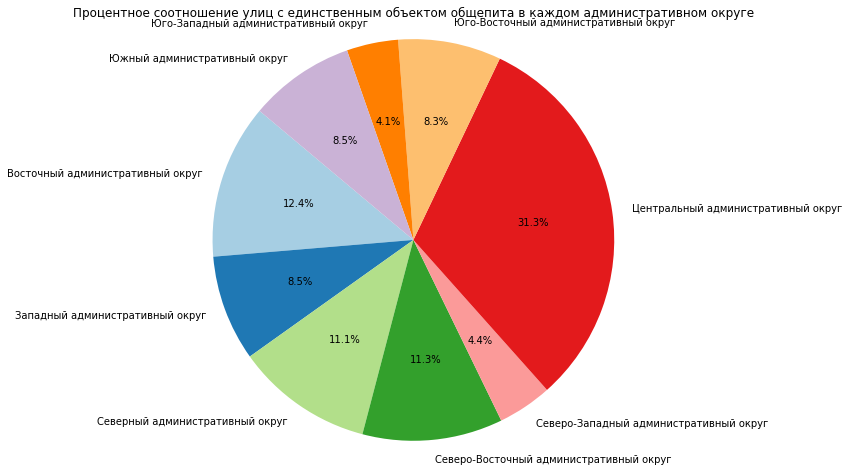

In [46]:
# Задаем данные для визуализации
labels = streets_count_by_district['district']
sizes = streets_count_by_district['street']

# Построение круговой диаграммы
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Процентное соотношение улиц с единственным объектом общепита в каждом административном округе')
plt.show()

В центральном административном округе (ЦАО) больше всего улиц с единственным объектом общепита (136 улиц). Восточный административный округ также имеет заметное количество таких улиц (54 улицы). Северо-Восточный административный округ и Северный административный округ также отличаются высоким количеством улиц с единственными заведениями (49 и 48 улиц соответственно).

#### Анализ величины среднего чека

In [47]:
# Создаем копию данных для медианы и группировки
median_prices_by_district = data[['district', 'middle_avg_bill']].copy()

# Заменяем диапазон значений на медиану
median_prices_by_district['middle_avg_bill'] = median_prices_by_district['middle_avg_bill'].apply(lambda x: x.split('-')[0] if '-' in str(x) else x)

# Преобразуем столбец в числовой формат
median_prices_by_district['middle_avg_bill'] = pd.to_numeric(median_prices_by_district['middle_avg_bill'], errors='coerce')

# Группируем по районам и находим медиану
median_prices_by_district = median_prices_by_district.groupby('district')['middle_avg_bill'].median().reset_index()

# Загрузка JSON-файла с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# Создаем карту Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


# Создаем хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=state_geo,
    data=median_prices_by_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Медиана цен в районах',
).add_to(m)

# Выводим карту
m


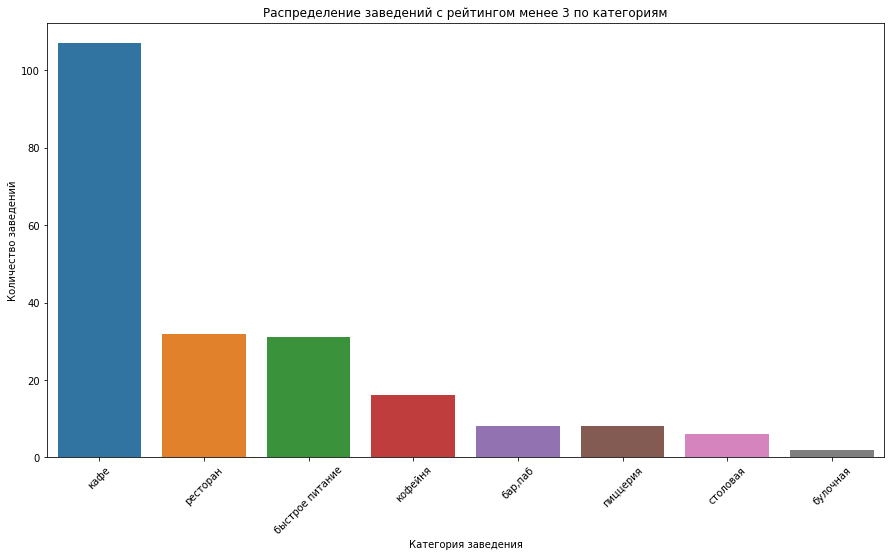

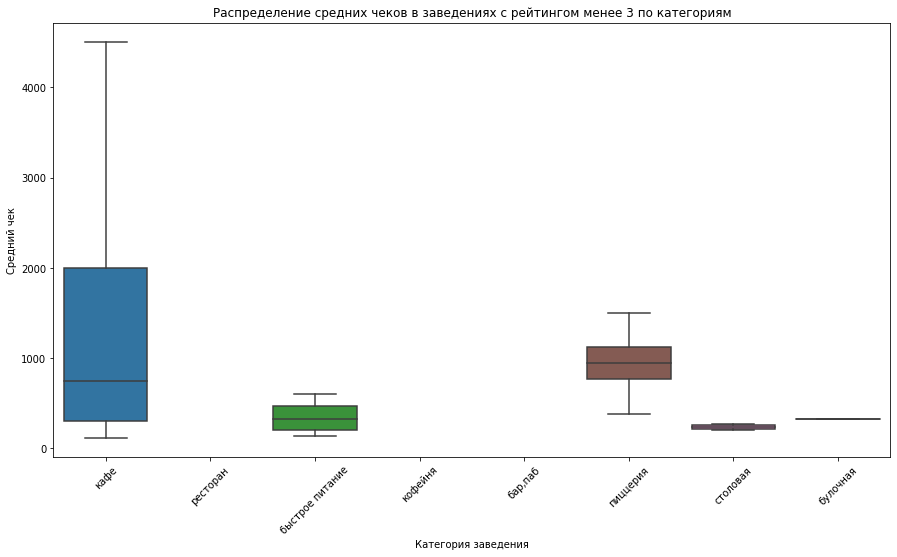

In [48]:
# Сгруппируем данные по категориям и подсчитаем количество заведений
category_counts = data[data['rating'] < 3]['category'].value_counts().sort_values(ascending=False)

# Отобразим распределение заведений по категориям
plt.figure(figsize=(15, 8))
sns.countplot(x='category', data=data[data['rating'] < 3], order=category_counts.index)
plt.title('Распределение заведений с рейтингом менее 3 по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.show()

# Отобразим распределение средних чеков по категориям
plt.figure(figsize=(15, 8))
sns.boxplot(x='category', y='middle_avg_bill', data=data[data['rating'] < 3], order=category_counts.index)
plt.title('Распределение средних чеков в заведениях с рейтингом менее 3 по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Средний чек')
plt.xticks(rotation=45)
plt.show()



Анализ данных о заведениях общественного питания в Москве позволил сделать следующие выводы:

#### Категории заведений:

- В Москве представлено 8 основных категорий заведений общественного питания: кафе, рестораны, кофейни, пиццерии, бары и пабы, быстрое питание, булочные и столовые.
- Кафе являются наиболее популярной категорией, представленной более чем на 28%.
- Рестораны и кофейни также имеют существенную долю на рынке с 24% и 7% соответственно.

#### Сетевые и несетевые заведения:

- Несмотря на преобладание несетевых заведений (более 61%), сетевые заведения имеют значительную долю в ресторанном бизнесе Москвы.
- Сетевые заведения чаще всего представлены в категориях кафе, кофеен, ресторанов и предприятий быстрого питания.

#### Распределение заведений по округам:

- Центральный административный округ (ЦАО) является лидером по количеству заведений, за ним следуют Северный и Восточный административные округа.
- Самый низкий показатель у Юго-Западного административного округа.

#### Топ-15 улиц по количеству заведений:

 Проспект Мира, Профсоюзная улица, Проспект Вернадского и другие являются лидерами по количеству заведений.

#### Средний рейтинг заведений по категориям:

Бары и пабы имеют самый высокий средний рейтинг (4.39), за ними следуют рестораны (4.29), а кофейни также демонстрируют хороший рейтинг (4.28).
В целом, заведения имеют средний рейтинг в диапазоне от 4.0 до 4.5, что говорит о высоком качестве предоставляемых услуг.

#### Цены и районы:

Районы Центрального административного округа (ЦАО) обладают более высокими средними чеками в сравнении с другими округами, что может быть обусловлено их центральным расположением и повышенным спросом.

#### Улицы с единственным объектом общепита:

Центральный административный округ (ЦАО) также имеет наибольшее количество улиц с единственным объектом общепита.

#### Особенности сетевых заведений:

В топ-15 сетевых заведений входят такие популярные сети, как "Шоколадница", "Домино'с Пицца", "Додо Пицца" и другие. Большинство из них представлены в категориях кафе, рестораны и пиццерии.

#### Исследование: открытие кофейни

In [49]:
coffee_shops= data.query('category == "кофейня" ')
coffee_shops_count = data[data['category'] == 'кофейня'].shape[0]
print(f"Всего кофеен в датасете: {coffee_shops_count}")


Всего кофеен в датасете: 1413


In [50]:
coffee_shops_by_district = data[data['category'] == 'кофейня']['district'].value_counts().reset_index()
coffee_shops_by_district.columns = ['district', 'coffee_shops_count']

# Вывод топ-10 районов с наибольшим количеством кофеен
top_districts_coffee_shops = coffee_shops_by_district.head(10)
print(top_districts_coffee_shops)


                                  district  coffee_shops_count
0       Центральный административный округ                 428
1          Северный административный округ                 193
2  Северо-Восточный административный округ                 159
3          Западный административный округ                 150
4             Южный административный округ                 131
5         Восточный административный округ                 105
6      Юго-Западный административный округ                  96
7     Юго-Восточный административный округ                  89
8   Северо-Западный административный округ                  62


In [51]:
# Выбираем кофейни и отображаем их рейтинги и распределение по районам
coffee_shops_ratings = data[data['category'] == 'кофейня'][['name', 'rating', 'district']]
print(coffee_shops_ratings.head())


                    name  rating                         district
3   dormouse coffee shop     5.0  Северный административный округ
25       в парке вкуснее     4.3  Северный административный округ
45          9 bar coffee     4.0  Северный административный округ
46              cofefest     3.6  Северный административный округ
52                 cofix     3.8  Северный административный округ


In [52]:
# Определяем стоимость чашки капучино
cappuccino_prices = data[data['category'] == 'кофейня']['price'].value_counts().reset_index()
cappuccino_prices.columns = ['cappuccino_price_range', 'count']
print(cappuccino_prices)


  cappuccino_price_range  count
0                средние    377
1                 низкие     68
2                высокие     17
3          выше среднего     14


In [53]:
# Создаем карту Москвы
moscow_map = folium.Map(location=[55.7558, 37.6176], zoom_start=11)

# Создаем кластер маркеров для кофеен
marker_cluster = MarkerCluster().add_to(moscow_map)

# Добавляем маркеры кофеен на карту
for index, row in coffee_shops.iterrows():
    folium.Marker([row['lat'], row['lng']], popup=row['name']).add_to(marker_cluster)

# Отображаем карту
moscow_map


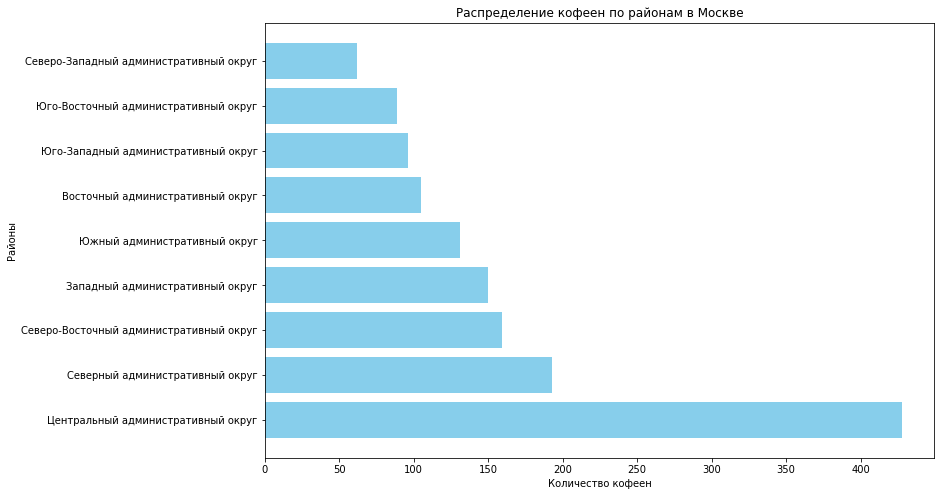

In [54]:
# Группируем данные по районам и считаем количество кофеен в каждом районе
coffee_shops_by_district = coffee_shops['district'].value_counts().reset_index()
coffee_shops_by_district.columns = ['district', 'coffee_shops_count']

# Сортируем по количеству кофеен
coffee_shops_by_district = coffee_shops_by_district.sort_values(by='coffee_shops_count', ascending=False)

# Строим горизонтальную столбчатую диаграмму
plt.figure(figsize=(12, 8))
plt.barh(coffee_shops_by_district['district'], coffee_shops_by_district['coffee_shops_count'], color='skyblue')
plt.xlabel('Количество кофеен')
plt.ylabel('Районы')
plt.title('Распределение кофеен по районам в Москве')
plt.show()


In [55]:
# Создадим карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

count_coffee_shops=coffee_shops.groupby('district', as_index=False)['name'].agg('count')

# Добавим хороплет
Choropleth(
    geo_data=state_geo,
    data=count_coffee_shops,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам',
).add_to(m)

# Добавим маркеры для кофеен с информацией о рейтинге
for idx, row in coffee_shops.iterrows():
    popup_text = f"{row['name']}, Рейтинг: {row['rating']}"
    marker = folium.Marker([row['lat'], row['lng']], popup=Popup(popup_text, max_width=300))
    marker.add_to(m)

m

Средняя оценка кофеен - 4.3


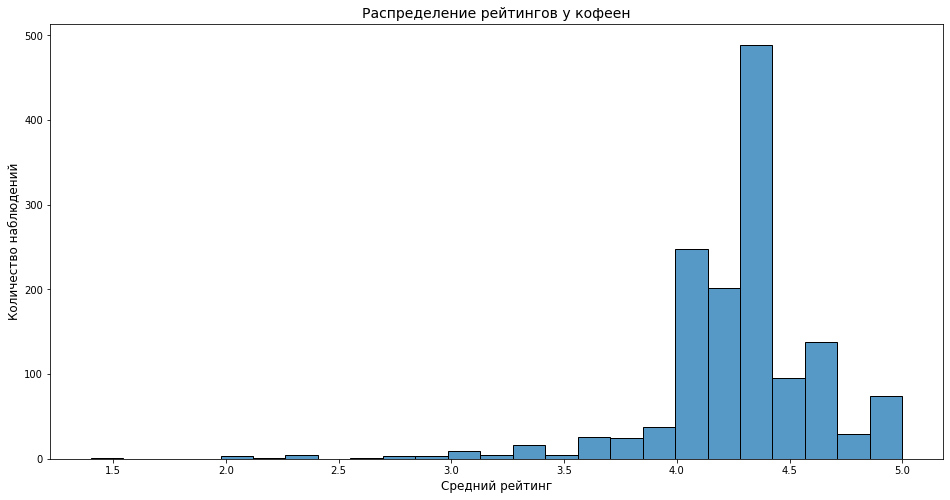

In [56]:
plt.figure(figsize=(16,8))
ax = sns.histplot(x=coffee_shops.rating, bins=25)
ax.set_title('Распределение рейтингов у кофеен', fontsize=14)
ax.set_ylabel('Количество наблюдений', fontsize=12)
ax.set_xlabel('Средний рейтинг', fontsize=12)
print(f'Средняя оценка кофеен - {coffee_shops.rating.mean():0.1f}')
plt.show()

In [57]:
price_cof_houses = coffee_shops.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=price_cof_houses,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Медианная стоимость капучино по районам',
).add_to(m)
m

В западном, юго-западном и ценральном округах самые высокие цены на капучино.

Наибольшее количество кофеен сосредоточено в центре города, что является типичным явлением для крупных мегаполисов. Следовательно, открытие новой кофейни в центре Москвы представляется перспективным, учитывая высокий поток людей и активную городскую жизнь.

Отдельно стоит отметить, что большинство кофеен в центральных округах имеют средние цены на капучино. Это может свидетельствовать о том, что в этих районах преобладает средний уровень доходов у посетителей, что является важным фактором при определении ценовой политики.

Рейтинг кофеен в Северном административном округе, варьируется от 3.6 до 5.0, что указывает на разнообразие заведений с разным качеством обслуживания. Необходимо уделить внимание высоко рейтингованным заведениям, чтобы успешно конкурировать на рынке.

Распределение цен на капучино также важно учитывать при определении ценовой политики для новой кофейни. Большинство заведений предоставляют средние цены, что может быть оптимальным вариантом для привлечения разнообразной аудитории.

In [58]:

# Фильтруем данные для круглосуточных кофеен
round_the_clock_coffee = coffee_shops[coffee_shops['is_247'] == True]

# Создаем карту Москвы
moscow_map = folium.Map(location=[55.7558, 37.6176], zoom_start=11)

# Создаем кластер маркеров для круглосуточных кофеен
marker_cluster = MarkerCluster().add_to(moscow_map)

# Добавляем маркеры круглосуточных кофеен на карту
for index, row in round_the_clock_coffee.iterrows():
    folium.Marker([row['lat'], row['lng']], popup=row['name']).add_to(marker_cluster)

# Отображаем карту
moscow_map
